In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0, '../..')

import numpy as np
import src.viz_utils as viz_utils
import importlib
from src.utils import CanonPart, CanonPartMetadata, get_pointcloud_in_cam_frame, transform_cloud_to_base, remove_outliers, pos_quat_to_transform, project_3d_bounding_box
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from torchvision import transforms
from PIL import Image
import torch
from src.seg_utils import *
import open3d as o3d
import open3d.visualization.gui as gui
import copy as cp
import matplotlib
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from pytorch_lightning import seed_everything


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


pybullet build time: May 20 2022 19:45:31


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
img_input_resize_size = 672

dm = Dinov2Matcher(device=device, repo_name="facebookresearch/dinov2", model_name="dinov2_vitg14", img_input_size=img_input_resize_size)

Using cache found in /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main
WARNING - 2025-01-15 06:29:45,074 - warnings - /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")

WARNING - 2025-01-15 06:29:45,074 - warnings - /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")

WARNING - 2025-01-15 06:29:45,077 - warnings - /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")

INFO - 2025-01-15 06:29:45,091 - vision_transformer - using SwiGLU layer as FFN


672


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sam_checkpoint = '/home/rthomp12/ObjectPartSeg/sam_vit_h_4b8939.pth'  # Path to the SAM checkpoint
sam_predictor = load_sam(sam_checkpoint,device)

In [4]:
# Load OWLv2.
import torch
from transformers import Owlv2Processor, Owlv2ForObjectDetection
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from io import BytesIO

# Load the model and processor
# options: google/owlv2-large-patch14, google/owlv2-large-patch14-ensemble,
# google/owlv2-large-patch14, google/owlv2-base-patch16, google/owlv2-base-patch16-ensemble
owl_model_name = "google/owlv2-base-patch16"  # TODO: Select "-ensemble" for a stronger model.
owl_model = Owlv2ForObjectDetection.from_pretrained(owl_model_name)#.to("cuda")
owl_processor = Owlv2Processor.from_pretrained(owl_model_name)

[0.53089548 0.06355652 0.33952086] [ 0.96756793 -0.14827697  0.1413215  -0.1478326 ]


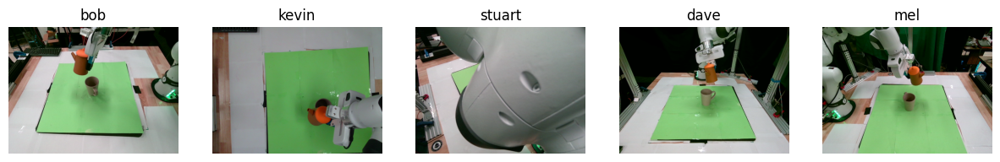

In [ ]:
grasp = False

test_root = "/home/rthomp12/fewshot/scripts/experiment_notebooks/zz_parts_teapot_on_mug_test_20250115-070705_yellow_teapot_eggnog_mug"
demo_root = "/home/rthomp12/fewshot/scripts/experiment_notebooks/teapot_on_mug_20250114-151255"

if grasp: 
  test_root = "/home/rthomp12/fewshot/scripts/experiment_notebooks/mug"

grasp_root = ""

#Load the files and camera information
demo_data_file = f"{demo_root}/initial_scene.npy"
demo_masks_and_features_file = f"{demo_root}/masks_and_features.npz"
# data_file = '/home/rthomp12/fewshot/scripts/experiment_notebooks/blue_teapot_peep_mug_demo/initial_scene.npy'

# Load recorded demo transformation
demo_transform = np.load(f"{demo_root}/ee_transform.npz")
demo_init_transform = pos_quat_to_transform(demo_transform['init_pos'],
                                            demo_transform['init_quat'])

test_data_file = f"{test_root}/initial_scene.npy"
test_transform = np.load( f"{test_root}/ee_transform.npz")
test_init_transform = pos_quat_to_transform(test_transform['init_pos'],
                                            test_transform['init_quat'])

print(test_transform['init_pos'], test_transform['init_quat'])

demo_scene = np.load(demo_data_file, allow_pickle=True).item()
demo_masks_and_features = np.load(demo_masks_and_features_file, allow_pickle=True)

demo_image = demo_scene['rgbs']['dave']
demo_img_features = demo_masks_and_features['demo_img_features'].item()
demo_img_metadata = demo_masks_and_features['demo_img_metadata'].item()
resized_demo_masks = demo_masks_and_features['demo_masks'].item()

initial_scene = np.load(test_data_file, allow_pickle=True).item()
camera_names = initial_scene['cam_names']
camera_names.remove('kevin') # Poor results so we exclude it 
demo_index = 2
demo_camera = camera_names[demo_index]
test_cameras = camera_names[:demo_index] + camera_names[demo_index+1:]

rgb_images = initial_scene['rgbs']
depth_images = initial_scene['depths']
intrinsics = initial_scene['intrinsic']
extrinsics = initial_scene['extrinsic']
crops = {'child': {}, 'parent': {}}
crop_coords = {'child': {}, 'parent': {}}
centroids =  {'child': {}, 'parent': {}}

scale = 3
plt.figure(figsize=(scale * len(rgb_images.keys()), scale))
for i, key in enumerate(rgb_images.keys()):
  plt.subplot(1, len(rgb_images.keys()), 1 + i)
  plt.title(key)
  plt.imshow(rgb_images[key])
  plt.axis("off")
plt.show()

In [6]:
#Experiment data
#Select the experiment type 

## Mug v Rack
# parent_part_names = ['trunk', 'branch']
# child_part_names = ['cup', 'handle']


# parent_part_model_files = {'trunk': '/home/rthomp12/fewshot/part_based_warp_models/trunk_dict_20240412-042732', 
#                            'branch': '/home/rthomp12/fewshot/part_based_warp_models/branch_dict_20240412-042732'}

# child_part_model_files = {'cup': '/home/rthomp12/fewshot/part_based_warp_models/cup_dict_20240202-160637',
#                           'handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20240202-160637'}
# # parent_object = "mug tree"
# # parent_object = "tree for hanging mugs"
# # parent_object = "small brown tree"
# parent_object = "wooden stick"
# child_object = "mug"

# #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~Teapot v Mug
parent_part_names = ['cup', 'handle']
child_part_names = ['body', 'spout', 'lid']

parent_part_model_files = {'cup': '/home/rthomp12/fewshot/mug_cup_20250103-220631_5',
                           'handle': '/home/rthomp12/fewshot/mug_handle_20250103-220631_5'}
child_part_model_files = {'body': '/home/rthomp12/fewshot/part_based_warp_models/body_dict_20241031-012841_5', 
                          'lid': '/home/rthomp12/fewshot/part_based_warp_models/lid_dict_20241031-012841_5',
                          'spout': '/home/rthomp12/fewshot/part_based_warp_models/spout_dict_20241031-012841_5',
                          'tea_handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20241031-012841_5', }

parent_object = "mug"


# #~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Mug v Watering Can
# parent_part_names = ['cup', 'handle']
# child_part_names = ['body', 'tea_handle', 'spout', ]

# parent_part_model_files = {'cup': '/home/rthomp12/fewshot/mug_cup_20250103-220631_5',
#                            'handle': '/home/rthomp12/fewshot/mug_handle_20250103-220631_5'}
# child_part_model_files = {'body': '/home/rthomp12/fewshot/part_based_warp_models/body_dict_20241031-012841_5', 
#                           'spout': '/home/rthomp12/fewshot/part_based_warp_models/spout_dict_20241031-012841_5',
#                           'tea_handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20241031-012841_5', }

# parent_object = "mug"


# # Bowl v Mug

# parent_part_names = ['cup', 'handle']
# child_part_names = ['whole_bowl']

# parent_part_model_files = {'cup': '/home/rthomp12/fewshot/part_based_warp_models/cup_dict_20240202-160637',
#                           'handle': '/home/rthomp12/fewshot/part_based_warp_models/handle_dict_20240202-160637'}
# child_part_model_files = {'whole_bowl': '/home/rthomp12/fewshot/part_based_warp_models/whole_bowl_20240426-000022_10'}

# parent_object = "mug"
# child_object = "bowl"

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Whole Objects ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# whole=True
# # Mug v Rack
# parent_part_names = ['tree']
# child_part_names = ['mug']


# parent_part_model_files = {'tree': '/home/rthomp12/fewshot/part_based_warp_models/whole_syn_rack_easy_20240412-042732',}

# child_part_model_files = {'mug': '/home/rthomp12/fewshot/whole_mug_20240502-182007_6',}
# # parent_object = "mug tree"
# # parent_object = "tree for hanging mugs"
# # parent_object = "small brown tree"
# parent_object = "wooden stick"

# whole = True
# parent_part_names = ['mug']
# child_part_names = ['whole_teapot']

# parent_part_model_files = {'mug': '/home/rthomp12/fewshot/whole_mug_20240502-182007_6',}
# child_part_model_files = {'whole_teapot': None}

# parent_object = "mug"


# whole=True
# # Mug v Rack
# parent_part_names = ['mug']
# child_part_names = ['whole_bowl']


# parent_part_model_files = {'mug': '/home/rthomp12/fewshot/whole_mug_20240502-182007_6',}

# child_part_model_files = {'whole_bowl': '/home/rthomp12/fewshot/part_based_warp_models/whole_bowl_20240426-000022_10'}

# parent_object = "mug"


# parent_part_models = {part: CanonPart.from_pickle(parent_part_model_files[part]) for part in parent_part_names}
# child_part_models = {part: CanonPart.from_pickle(child_part_model_files[part]) for part in child_part_names}

all_part_names = parent_part_names + child_part_names

# Crop to gripper.
crops = {'child': {}, 'parent':{}}
# Use these as image[c[0]: c[1], c[2]: c[3]]
crop_coords = {'child': {}, 'parent':{}}
centroids = {'child': {}, 'parent':{}}

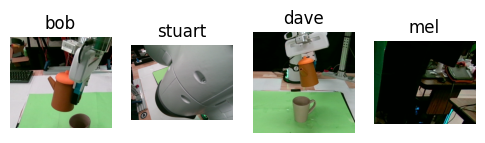

In [7]:
crop_size = 125
for name in camera_names:
  image = Image.fromarray(rgb_images[name])

  inputs = owl_processor(text=[parent_object], images=image, return_tensors="pt")
  # inputs = {key: val.to("cuda") for key, val in inputs.items()}  # Running out of GPU memory.

  outputs = owl_model(**inputs)

  target_sizes = torch.tensor([image.size[::-1]])
  threshold = 0.05
  results = owl_processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=threshold)

  # Extract results for the first image
  result = results[0]
  boxes = result["boxes"]
  scores = result["scores"]
  labels = result["labels"]

  # Define colors for different labels
  colors = ["red", "blue", "green", "orange", "purple"]

  # Draw bounding boxes and labels
  best_score = 0
  best_box = None

  for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
    if score > threshold:  # Display boxes with confidence above the threshold
      x_min, y_min, x_max, y_max = box.tolist()
      width, height = x_max - x_min, y_max - y_min
      color = colors[i % len(colors)]

      if best_score < score:
        best_score = score
        best_box = box

  if best_box is None:
    # Failed to find the target object. Using the whole image.
    min_x = 0
    max_x = rgb_images[name].shape[1]
    min_y = 0
    max_y = rgb_images[name].shape[0]
    center = rgb_images[name].shape[1] / 2, rgb_images[name].shape[0] / 2
  else:
    center = (best_box[0] + best_box[2]) / 2, (best_box[1] + best_box[3]) / 2

    min_x, max_x = int(center[0] - crop_size), int(center[0] + crop_size)
    min_y, max_y = int(center[1] - crop_size), int(center[1] + crop_size)

    height, width, _ = rgb_images[name].shape
    min_x, max_x, min_y, max_y = crop_to_bounds(min_x, max_x, min_y, max_y, height, width)

  crop = rgb_images[name][min_y: max_y, min_x: max_x]

  crops['parent'][name] = crop
  crop_coords['parent'][name] = (min_y, max_y, min_x, max_x)
  centroids['parent'][name] = center


scale = 3
plt.figure(figsize=(scale * len(crops), scale))
for i, crop in enumerate(crops['parent'].keys()):
    # print(crop, crops['child'][crop].shape)
    plt.subplot(1, len(crops['parent'].keys()), 1 + i)
    plt.title(crop)
    plt.imshow(crops['parent'][crop])
    plt.axis("off")

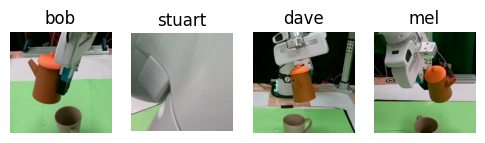

In [8]:
#Get Child Crops
crop_size = 100
if not grasp: 
    for name in camera_names:
        corners_2d, _ = project_3d_bounding_box(test_init_transform, extrinsics[name], intrinsics[name], 0.4)
        center = corners_2d[-1]
        # print(name, center)

        min_x, max_x = int(center[0] - crop_size), int(center[0] + crop_size)
        min_y, max_y = int(center[1] - crop_size), int(center[1] + crop_size)

        height, width, _ = rgb_images[name].shape
        min_x, max_x, min_y, max_y = crop_to_bounds(min_x, max_x, min_y, max_y, height, width)

        crop = rgb_images[name][min_y: max_y, min_x: max_x]

        crops['child'][name] = crop
        crop_coords['child'][name] = (min_y, max_y, min_x, max_x)
        centroids['child'][name] = center

    scale = 3
    plt.figure(figsize=(scale * len(crops), scale))
    for i, crop in enumerate(crops['child'].keys()):
        # print(crop, crops['child'][crop].shape)
        plt.subplot(1, len(crops['child'].keys()), 1 + i)
        plt.title(crop)
        plt.imshow(crops['child'][crop])
        plt.axis("off")
else:
    crop_size = 125
    for name in camera_names:
        image = Image.fromarray(rgb_images[name])

        inputs = owl_processor(text=[child_object], images=image, return_tensors="pt")
        # inputs = {key: val.to("cuda") for key, val in inputs.items()}  # Running out of GPU memory.

        outputs = owl_model(**inputs)

        target_sizes = torch.tensor([image.size[::-1]])
        threshold = 0.05
        results = owl_processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=threshold)

        # Extract results for the first image
        result = results[0]
        boxes = result["boxes"]
        scores = result["scores"]
        labels = result["labels"]

        # # Create a plot
        # fig, ax = plt.subplots(1, figsize=(12, 8))
        # ax.imshow(image)

        # Define colors for different labels
        colors = ["red", "blue", "green", "orange", "purple"]

        # Draw bounding boxes and labels
        best_score = 0
        best_box = None

        for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
            if score > threshold:  # Display boxes with confidence above the threshold
                x_min, y_min, x_max, y_max = box.tolist()
                width, height = x_max - x_min, y_max - y_min
                color = colors[i % len(colors)]

            # # Create a rectangle patch
            # rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor=color, facecolor='none')
            # ax.add_patch(rect)

            # # Add label and score
            # ax.text(x_min, y_min - 10, f"{parent_object}: {score:.2f}", color=color, fontsize=12, weight='bold', backgroundcolor='white')

            if best_score < score:
                best_score = score
                best_box = box

        # # Show the plot
        # plt.axis("off")
        # plt.show()

        if best_box is None:
            # Failed to find the target object. Using the whole image.
            min_x = 0
            max_x = rgb_images[name].shape[1]
            min_y = 0
            max_y = rgb_images[name].shape[0]
        else:
            center = (best_box[0] + best_box[2]) / 2, (best_box[1] + best_box[3]) / 2

            min_x, max_x = int(center[0] - crop_size), int(center[0] + crop_size)
            min_y, max_y = int(center[1] - crop_size), int(center[1] + crop_size)

            height, width, _ = rgb_images[name].shape
            min_x, max_x, min_y, max_y = crop_to_bounds(min_x, max_x, min_y, max_y, height, width)

        crop = rgb_images[name][min_y: max_y, min_x: max_x]

        crops['child'][name] = crop
        crop_coords['child'][name] = (min_y, max_y, min_x, max_x)
        centroids['child'][name] = center


    scale = 3
    plt.figure(figsize=(scale * len(crops), scale))
    for i, crop in enumerate(crops['child'].keys()):
        # print(crop, crops['child'][crop].shape)
        plt.subplot(1, len(crops['child'].keys()), 1 + i)
        plt.title(crop)
        plt.imshow(crops['child'][crop])
        plt.axis("off")

In [9]:
torch.cuda.empty_cache()  # Doesn't really help.

# Take points from one view. Find the object parts in other views.
test_img_features = {"child": {}, "parent": {}}
test_img_metadata = {"child": {}, "parent": {}}

# Get features for test image crops from multiple cameras.
for obj in ["child", "parent"]:
  for camera in camera_names:
    test_img = crops[obj][camera]
    test_img_tensor, test_img_grid_size, test_img_resize_scale = dm.prepare_image(test_img)
    test_img_features[obj][camera] = dm.extract_features(test_img_tensor)
    test_img_metadata[obj][camera] = {"grid_size": test_img_grid_size, "resize_scale": test_img_resize_scale}

INFO - 2025-01-15 06:30:22,029 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,054 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,134 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,242 - seed - Seed set to 0


(2400, 1536)
(91, 1536)


INFO - 2025-01-15 06:30:22,265 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,349 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,418 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,456 - seed - Seed set to 0


(2400, 1536)
(17, 1536)
(2400, 1536)
(20, 1536)


INFO - 2025-01-15 06:30:22,508 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,598 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,643 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,726 - seed - Seed set to 0


(2304, 1536)
(92, 1536)


INFO - 2025-01-15 06:30:22,907 - seed - Seed set to 0
INFO - 2025-01-15 06:30:22,928 - seed - Seed set to 0
INFO - 2025-01-15 06:30:23,009 - seed - Seed set to 0


(2304, 1536)
(5, 1536)


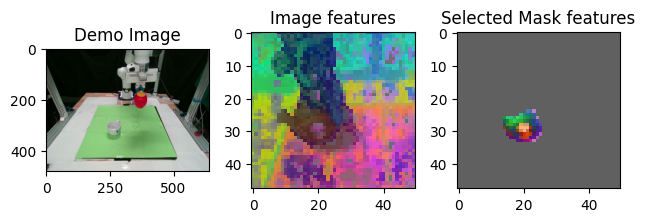

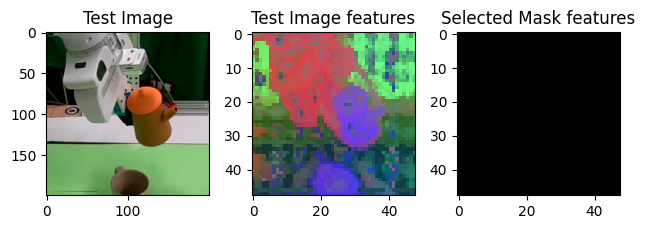

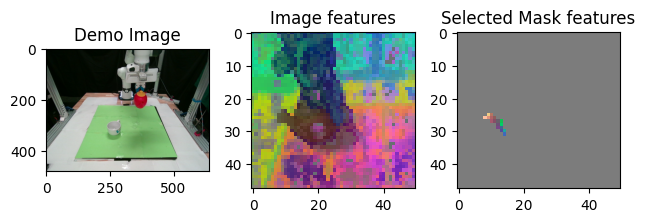

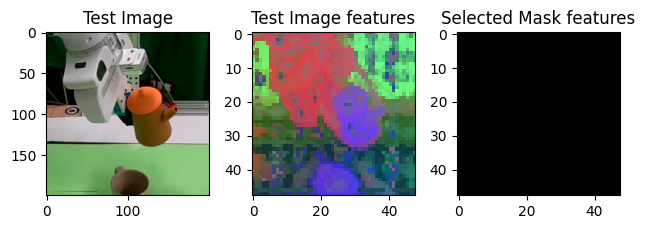

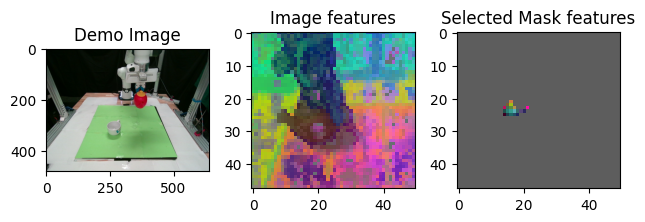

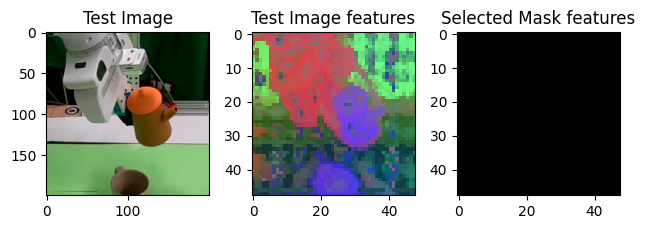

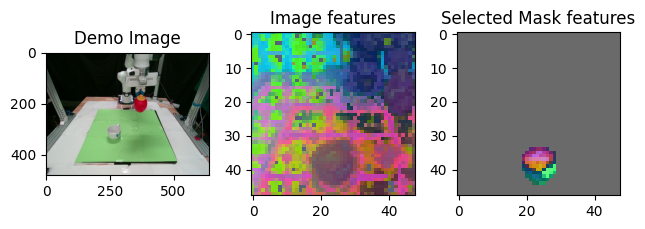

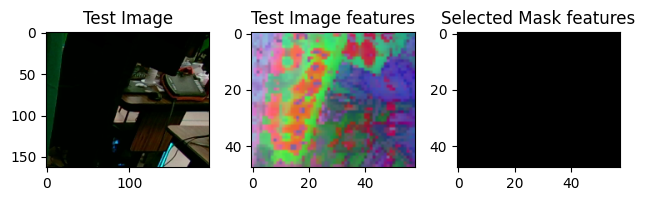

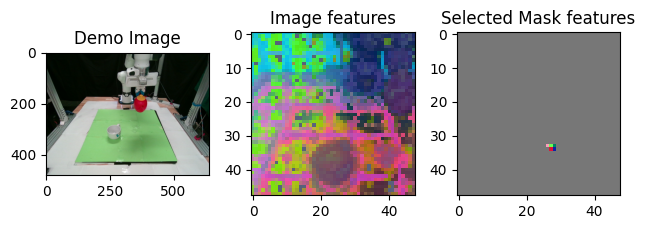

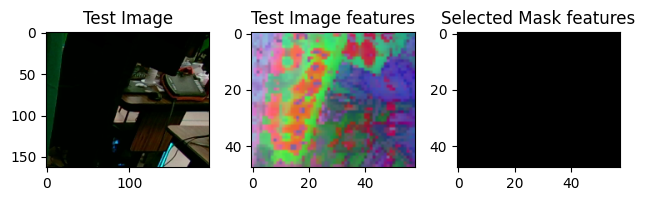

In [10]:
# Show DINOv2 features.
obj = "child"
viz_camera = "mel"

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    # Visualization
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3,)# figsize=(15,20))
    ax1.title.set_text("Demo Image")
    #ax1.title.set_fontsize(40)
    ax1.imshow(demo_image)
  
    image_feat_viz = dm.get_embedding_visualization(demo_img_features[obj], demo_img_metadata[obj]["grid_size"])
    mask_feat_viz = dm.get_embedding_visualization(demo_img_features[obj], demo_img_metadata[obj]["grid_size"], resized_demo_masks[obj][part])
    ax2.imshow(image_feat_viz)
    ax2.title.set_text("Image features")
    #ax2.title.set_fontsize(40)
    ax3.imshow(mask_feat_viz)
    ax3.title.set_text("Selected Mask features")
    #ax3.title.set_fontsize(40)
    fig.tight_layout()

    #visualize the test image and the extracted features
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, )#figsize=(15,20))
    ax1.imshow(crops[obj][viz_camera])
    ax1.title.set_text("Test Image")
    #ax1.title.set_fontsize(40)
    ax2.imshow(crops[obj][viz_camera])
    test_image_feat_viz = dm.get_embedding_visualization(test_img_features[obj][viz_camera], test_img_metadata[obj][viz_camera]["grid_size"])
    ax2.imshow(test_image_feat_viz)
    ax2.title.set_text("Test Image features")
    #ax2.title.set_fontsize(40)
    ax3.imshow(np.zeros_like(test_image_feat_viz))
    ax3.title.set_text("Selected Mask features")
    #ax3.title.set_fontsize(40)
    fig.tight_layout()

#   plt.show()

In [11]:
# V4: match between images using the background-to-object nearest neighbor ratio.
from sklearn.neighbors import NearestNeighbors
from collections import defaultdict
from scipy.ndimage import binary_dilation

def grow_mask(mask, iterations=1, kernel_size=3):
    """Grows a segmentation mask."""
    structure = np.ones((kernel_size, kernel_size), dtype=bool)
    return binary_dilation(mask, structure=structure, iterations=iterations)

universal_threshold = 0.9
#ratio_thresholds = {"child": {"cup": universal_threshold, "handle": universal_threshold}, "parent": {"trunk": universal_threshold, "branch": universal_threshold}}
ratio_thresholds = {"child": {part: universal_threshold for part in child_part_names},
                    "parent": {part: universal_threshold for part in parent_part_names}}

run_grow_mask = True

distances = {"child": defaultdict(dict), "parent": defaultdict(dict)}
match2to1 = {"child": defaultdict(dict), "parent": defaultdict(dict)}
for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    # Build knn using features from demo image, and query all features from test image
    mask_ft = demo_img_features[obj][resized_demo_masks[obj][part]]
    mask_ft = mask_ft / np.linalg.norm(mask_ft, axis=-1, keepdims=True)

    tmp = resized_demo_masks[obj][part].reshape(demo_img_metadata[obj]["grid_size"])
    if run_grow_mask:
      # Exclude object edges from the background features.
      tmp = grow_mask(tmp)
    tmp = np.logical_not(tmp).reshape(-1)
    # print(obj, part)
    # plt.figure()
    # plt.imshow(tmp)
    # plt.show()

    background_ft = demo_img_features[obj][tmp]
    background_ft = background_ft / np.linalg.norm(background_ft, axis=-1, keepdims=True)

    n = 10
    # Cannot have more nearest neighbor that total training points.
    n = min(n, len(mask_ft))
    mask_knn = NearestNeighbors(n_neighbors=n)
    background_knn = NearestNeighbors(n_neighbors=n)

    mask_knn.fit(mask_ft)
    background_knn.fit(background_ft)

    for camera in camera_names:
      test_ft = test_img_features[obj][camera]
      test_ft = test_ft / np.linalg.norm(test_ft, axis=-1, keepdims=True)

      mask_d, mask_m = mask_knn.kneighbors(test_ft)
      background_d, background_m = background_knn.kneighbors(test_ft)

      # Find matches where a point is close to the object feature but far from the background feature.
      # TODO: mean could be replaced with min/max/median.
      ratio = np.mean(mask_d, axis=-1) / np.mean(background_d, axis=-1)
      happy = ratio < ratio_thresholds[obj][part]
      happy_ind = np.where(happy)[0]
      # print(happy_ind)

      # Assume points with this distance will be filtered out later.
      mask_d[np.logical_not(happy)] = 1000.0

      distances[obj][part][camera] = mask_d[:, :1]
      match2to1[obj][part][camera] = mask_m[:, :1]

      # distances[obj][part][camera], match2to1[obj][part][camera] = knn.kneighbors(tmp) #find neighbour for each demo feature in test image and the distance
      match2to1[obj][part][camera] = np.array(match2to1[obj][part][camera])  # match2to1 is the index of the closest feature in demo_image for each feature in test_image

      # plt.figure()
      # plt.plot(sorted(distances[obj][part][camera]))
      # plt.xlabel('Test image feature index')
      # plt.ylabel('Distance to nearest neighbor in Demo image')
      # plt.title('Nearest neighbor distances')
      # plt.show()

matches_info = {"child": defaultdict(dict), "parent": defaultdict(dict)}
# threshold = 10.0
threshold = 100.0

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    for camera in camera_names:
      matches_info[obj][camera][part] = []
      for test_feature_idx, (dist, demo_feature_idx) in enumerate(zip(distances[obj][part][camera], match2to1[obj][part][camera])):
        demo_feature_idx = np.nonzero(resized_demo_masks[obj][part])[0][demo_feature_idx]
        row, col = dm.idx_to_source_position(demo_feature_idx, demo_img_metadata[obj]["grid_size"], demo_img_metadata[obj]["resize_scale"])
        xy_on_demo_image = (col, row)

        if dist > threshold:
          continue

        # if not trans_mask_full_to_crop(mask_masks[obj][demo_camera][part][0], *crop_coords[obj][demo_camera])[int(row), int(col)]:
        #   # TODO: This should never be triggered in the current implementation.
        #   continue # skip if feature we watch to visualize matching is not in the demo image mask

        row, col = dm.idx_to_source_position(test_feature_idx, test_img_metadata[obj][camera]["grid_size"], test_img_metadata[obj][camera]["resize_scale"])
        xy_on_test_image = (col, row)

        matches_info[obj][camera][part].append({"Demo_feature_idx": demo_feature_idx.item(),
                                                "Demo_coord": xy_on_demo_image,
                                                "Test_feature_idx": test_feature_idx,
                                                "Test_coord": xy_on_test_image,
                                                "Distance": dist.item()})

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


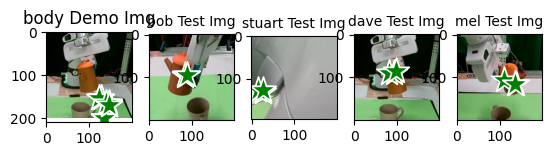

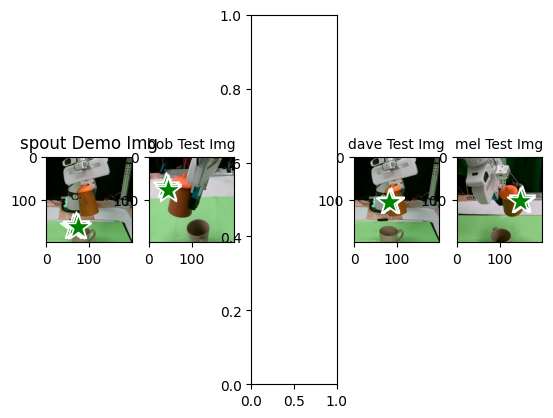

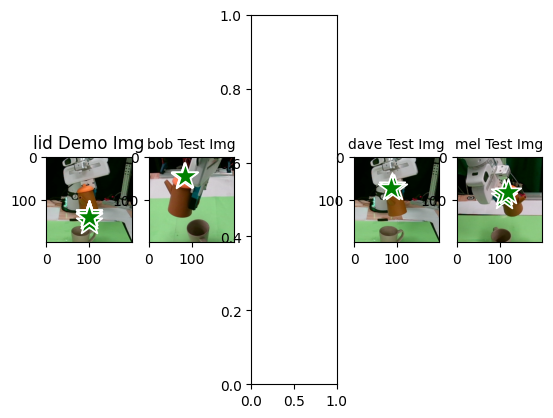

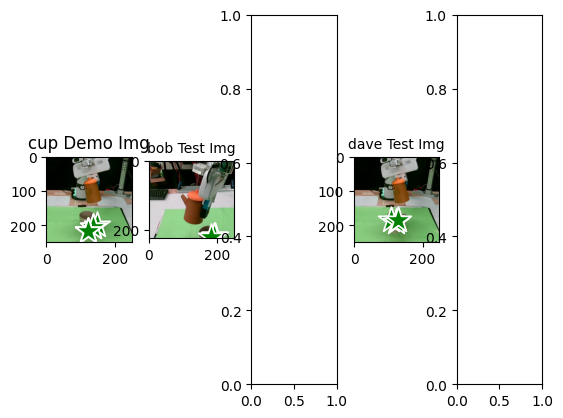

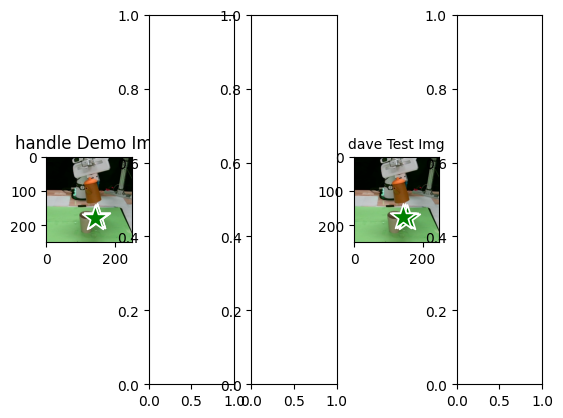

In [12]:
k = 3
top_k_demo_coords = {"child": defaultdict(dict), "parent": defaultdict(dict)}
top_k_test_coords = {"child": defaultdict(dict), "parent": defaultdict(dict)}

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    fig, ax = plt.subplots(1, len(camera_names)+1,)
    ax[0].imshow(crops[obj][demo_camera])
    ax[0].title.set_text(f"{part} Demo Img")
    for i, camera in enumerate(camera_names):

      matches_info[obj][camera][part] = sorted(matches_info[obj][camera][part], key=lambda x: x["Distance"])
      top_k_matches = matches_info[obj][camera][part][:k]
      top_k_demo_coords[obj][camera][part] = np.asarray([m["Demo_coord"] for m in top_k_matches])
      top_k_test_coords[obj][camera][part] = np.asarray([m["Test_coord"] for m in top_k_matches])
      if len(top_k_demo_coords[obj][camera][part]) > 0:
        show_points(top_k_demo_coords[obj][camera][part], np.ones(top_k_demo_coords[obj][camera][part].shape[0]), ax[0])
        ax[i+1].imshow(crops[obj][camera])
        ax[i+1].title.set_text(f"{camera} Test Img")
        ax[i+1].title.set_fontsize(10)
        show_points(top_k_test_coords[obj][camera][part], np.ones(top_k_test_coords[obj][camera][part].shape[0]), ax[i+1])


In [13]:
final_segments = {"child": defaultdict(dict), "parent": defaultdict(dict)}

for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    for camera in camera_names:
      if len(top_k_test_coords[obj][camera][part]) == 0:
        continue

      coords = top_k_test_coords[obj][camera][part]#trans_points_crop_to_full(top_k_test_coords[obj][camera][part], crop_coords[obj][camera][2], crop_coords[obj][camera][0])
      coords = coords.astype(np.int32)
      orig_coords = coords

      labels = np.ones(len(coords))
      for other_part in eval(f'{obj}_part_names'):
        if other_part == part:
          continue
        if len(top_k_test_coords[obj][camera][other_part]) == 0:
          continue
        tmp = top_k_test_coords[obj][camera][other_part]#trans_points_crop_to_full(top_k_test_coords[obj][camera][other_part], crop_coords[obj][camera][2], crop_coords[obj][camera][0])
        coords = np.concatenate([coords, tmp])
        labels = np.concatenate([labels, np.zeros(len(tmp))])

      tmp_mask, tmp_score, _ = segment(sam_predictor, crops[obj][camera], coords, labels, multimask_flag=False) #rgb_images[camera]

      whole_mask = np.zeros_like(rgb_images[camera][:,:,0])
      min_y, max_y, min_x, max_x = crop_coords[obj][camera]
      whole_mask[min_y: max_y, min_x: max_x] = tmp_mask[0]
      #tmp_mask = tmp_mask[0]
      tmp_mask = whole_mask
      tmp_score = float(tmp_score[0])

      final_segments[obj][part][camera] = {"mask": tmp_mask, "score": tmp_score, "coords": orig_coords}

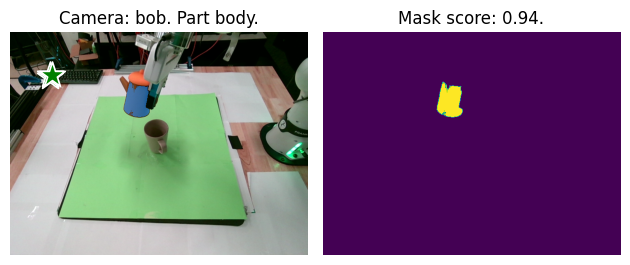

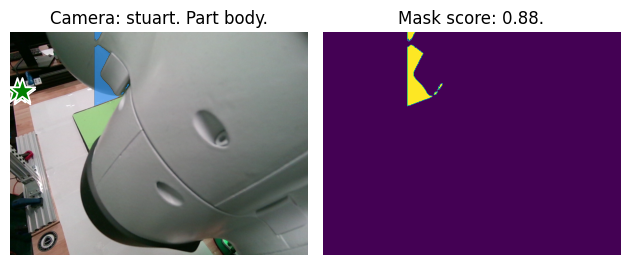

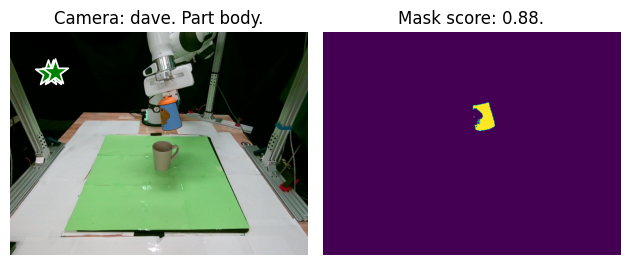

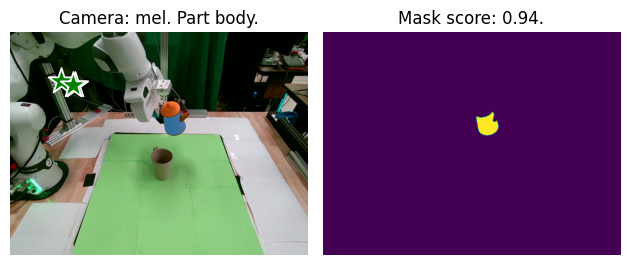

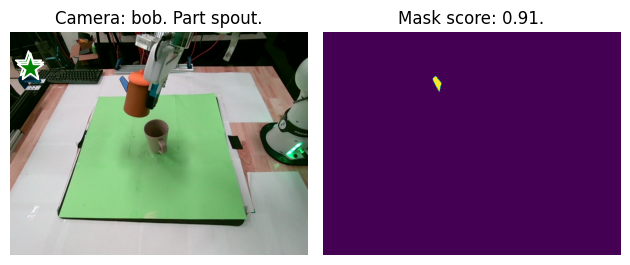

...

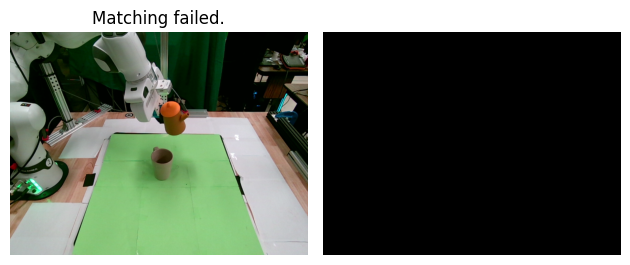

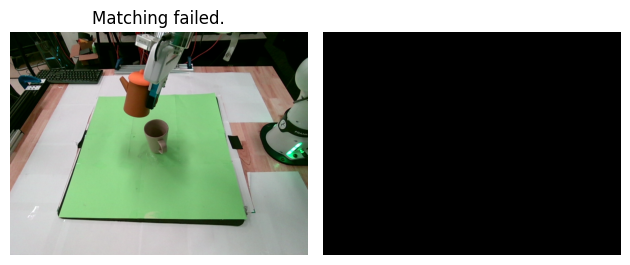

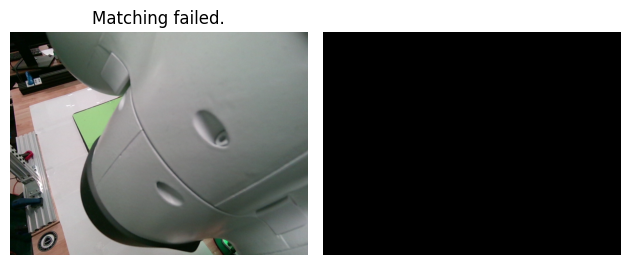

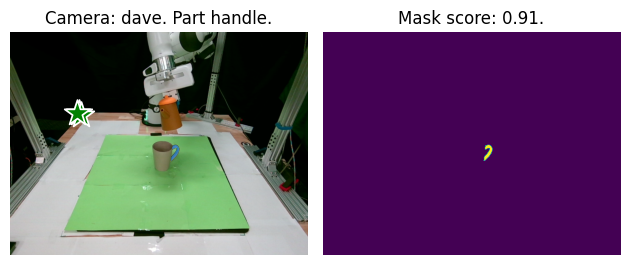

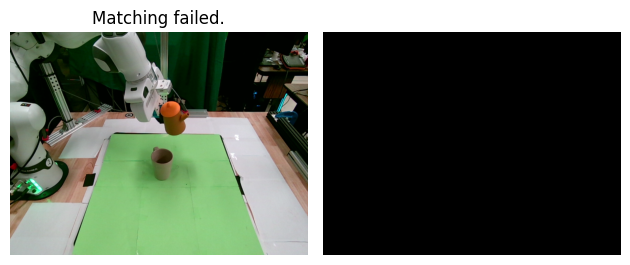

In [14]:
# Images where segmentation failed (zero matched points) will be skipped.
for obj in ["child", "parent"]:
  for part in eval(f'{obj}_part_names'):
    for camera in camera_names:

      fig, (ax1, ax2) = plt.subplots(1, 2,) #figsize=(10, 5))
      ax1.imshow(rgb_images[camera])
      ax1.axis("off")

      ax1.title.set_text(f"Camera: {camera}. Part {part}.")
      #ax1.title.set_fontsize(20)

      if camera in final_segments[obj][part]:
        show_mask(final_segments[obj][part][camera]["mask"], ax1)
        show_points(final_segments[obj][part][camera]['coords'], np.ones(len(final_segments[obj][part][camera]['coords'])), ax1)
        ax2.imshow(final_segments[obj][part][camera]["mask"])
      else:
        ax2.imshow(np.zeros_like(rgb_images[camera]))

      ax2.axis("off")

      if camera in final_segments[obj][part]:
        ax2.title.set_text(f"Mask score: {final_segments[obj][part][camera]['score']:.2f}.")
      else:
        ax1.title.set_text(f"Matching failed.")

      #ax2.title.set_fontsize(20)
      fig.tight_layout()

    #   from pathlib import Path
    #   save_dir = Path(f"drive/MyDrive/250103_brown/viz/{demo_name}")
    #   save_dir.mkdir(parents=True, exist_ok=True)
    #   plt.savefig(save_dir / f"test_{obj}_{part}_{camera}.png")
    #   plt.show()

      #final_segments["parent"]["cup"][demo_camera]["mask"] = np.bitwise_and(final_segments["parent"]["cup"][demo_camera]["mask"] , np.bitwise_not(final_segments["parent"]["handle"][demo_camera]["mask"] ))
      #final_segments["parent"]["handle"][demo_camera]["mask"]  = np.bitwise_and(final_segments["parent"]["handle"][demo_camera]["mask"] , np.bitwise_not(final_segments["parent"]["cup"][demo_camera]["mask"] ))
      # mask_masks["parent"][demo_camera]["cup"] = np.bitwise_and(mask_masks["parent"][demo_camera]["cup"], 
      #                                                     np.bitwise_not(mask_masks["child"][demo_camera]["whole_bowl"]))
      # mask_masks["parent"][demo_camera]["handle"] = np.bitwise_and(mask_masks["parent"][demo_camera]["handle"], 
      #                                                     np.bitwise_not(mask_masks["child"][demo_camera]["whole_bowl"]))



In [15]:
#PCL post-processing

pcls = {camera_name: get_pointcloud_in_cam_frame(rgb_images[camera_name],
                                                 depth_images[camera_name],
                                                intrinsics[camera_name]).reshape(depth_images[camera_name].shape[0], 
                                                                                 -1, 6) for camera_name in camera_names}
masked_pcls = {part:[] for part in all_part_names}
for camera_name in [ 'bob', 'stuart', 'mel']: #kevin is cut out bc i'm seeing Bad reflection issues with it:#camera_names:
    for obj in ['child', 'parent']:
        for part in eval(f'{obj}_part_names'):
            if camera_name not in final_segments[obj][part]:
                continue
            # mask = np.zeros(pcls[camera_name].shape[:2], dtype=bool)
            # min_y, max_y, min_x, max_x = crop_coords[obj][camera_name]
            # if obj == "parent":
            #     mask = mask_masks[camera_name][part][0]
            # else:
            #     mask[min_y: max_y, min_x: max_x] = mask_masks[camera_name][part]
            cloud = pcls[camera_name][final_segments[obj][part][camera_name]["mask"]==1]
            print(cloud.shape)
            if final_segments[obj][part][camera_name]['score'] >= .85:
                masked_pcls[part].append(transform_cloud_to_base(cloud, extrinsics, camera_name))
    
for part in all_part_names:
    try:
        masked_pcls[part] = np.concatenate(masked_pcls[part])[:, :3]
        if grasp: 
            masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] > .01]
        else:
            masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] > .01]
        masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] < .5]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,2] < .34]
        #masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,1] > -.38]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,0] > 0.4]
        # masked_pcls[part] = masked_pcls[part][masked_pcls[part][:,0] < 1.2]

        masked_pcls[part] = remove_outliers(masked_pcls[part], radius=.03)
    except ValueError:
        continue

(3046, 6)
(313, 6)
(83, 6)
(1632, 6)
(3795, 6)
(1579, 6)
(216, 6)
(1117, 6)
Remove radius outliers: [========================================] 100%
Remove radius outliers: [========================================] 100%dius outliers: [================>                       ] 40%
Remove radius outliers: [========================================] 100%
Remove radius outliers: [========================================] 100%


In [16]:
camera = dict(
    eye=dict(x=1.2, y=-1.2, z=.2),
    center=dict(x=.8,y=.5,z=0)
)

masked_pcls['cup'] = masked_pcls['cup'][masked_pcls['cup'][:,2] <.2]
# masked_pcls['body'] = masked_pcls['body'][masked_pcls['body'][:,2] >.2]

#masked_pcls['whole_bowl'] = masked_pcls['whole_bowl'][masked_pcls['whole_bowl'][:,2] <.3]

viz_utils.show_pcds_plotly({k:v for k,v in masked_pcls.items() if len(v) != 0}, camera=camera
)

In [17]:
if not grasp:
    #Save PCLs
    save_name = f'{test_root}/init_scene_pcls'
    np.savez(save_name, **masked_pcls)

In [18]:
if grasp: 

    from src.GraspSelector import test
    #Get PCL Normals (for grasp selection)
    # masked_pcls = np.load(save_name + '.npz')

    part = 'cup'
    numpy_pcd = np.concatenate([masked_pcls['cup'], masked_pcls['handle']])

    # part = 'tea_handle'
    # numpy_pcd = masked_pcls['tea_handle']

    # part = 'bowl'
    # numpy_pcd = masked_pcls['bowl']

    pcd = o3d.geometry.PointCloud()

    pcd.points = o3d.utility.Vector3dVector(numpy_pcd)
    pcd.estimate_normals()
    pcd = pcd.normalize_normals()


In [ ]:

if grasp: 
    fixed_roll_pitch = [-3.02168791,  0.06457332]
    
    from scipy.spatial.transform import Rotation
    grasp_index = 3 # higher indices have a higher predicted cost/are less optimal

    desired_grasp_poses = test(pcd,10)
    grasp_mat = desired_grasp_poses[grasp_index]

    fixed_grasp_transform  = Rotation.from_euler( 'yxz', [np.pi/2, np.pi/2, 0])
    grasp_rot = Rotation.from_matrix(grasp_mat[:3, :3])
    
    fixed_grasp_rot = Rotation.from_euler('xyz', fixed_roll_pitch + [grasp_rot.as_euler('xyz')[2]])
    grasp_mat[:3, :3] = fixed_grasp_rot.as_matrix()
    print("GRASP")
    print(repr(grasp_mat))
    print()
    
    import plotly.graph_objects as go
    #print(repr(desired_grasp_poses[grasp_index]))
    data =  [
            go.Scatter3d(
                x=numpy_pcd[:, 0],
                y=numpy_pcd[:, 1],
                z=numpy_pcd[:, 2],
                marker={"size": 5, "color": numpy_pcd[:, 2], "colorscale": "Plotly3"},
                mode="markers",
                opacity=1.0,
            )
        ] + viz_utils.make_axis_plotly(grasp_mat, .1)

    fig = go.Figure(data=data)
    fig.show()

: 